In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
import plotly.express as px
from geopy.distance import geodesic
from sklearn.model_selection import train_test_split as tts
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import KMeans
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import silhouette_score, mean_squared_error, mean_absolute_error
!pip install openrouteservice
import folium
import openrouteservice as ors
from openrouteservice import convert
import time
import warnings

warnings.filterwarnings('ignore')

In [ ]:
# Read in the data
# Read in the data in chunks in for loop and then convert it to a dataframe and see the time it takes to read the data
start_time = time.time()
cap_bks_oct = pd.DataFrame()

for chunk in pd.read_csv('202310-capitalbikeshare-tripdata.csv', chunksize=200000, low_memory=False):
    print('Number of chunks read: ', chunk.shape)
    cap_bks_oct  = pd.concat([cap_bks_oct , chunk])

print("Time taken to read the data: ", time.time() - start_time)

print("Shape of the dataframe: ", cap_bks_oct .shape)

# Check for missing values
print("Missing Values:")
print(cap_bks_oct.isnull().sum()/cap_bks_oct.shape[0])

# Drop the missing values
cap_bks_oct.dropna(inplace=True)

# Check for duplicates
print("Duplicates: ", cap_bks_oct.duplicated().sum())

# Downsample the data
cap_bks_oct = cap_bks_oct[: : 4]

Number of chunks read:  (200000, 13)
Number of chunks read:  (200000, 13)
Number of chunks read:  (91084, 13)
Time taken to read the data:  2.7172601222991943
Shape of the dataframe:  (491084, 13)
Missing Values:
ride_id               0.000000
rideable_type         0.000000
started_at            0.000000
ended_at              0.000000
start_station_name    0.115274
start_station_id      0.115274
end_station_name      0.122297
end_station_id        0.122297
start_lat             0.000000
start_lng             0.000000
end_lat               0.001112
end_lng               0.001112
member_casual         0.000000
dtype: float64
Duplicates:  0


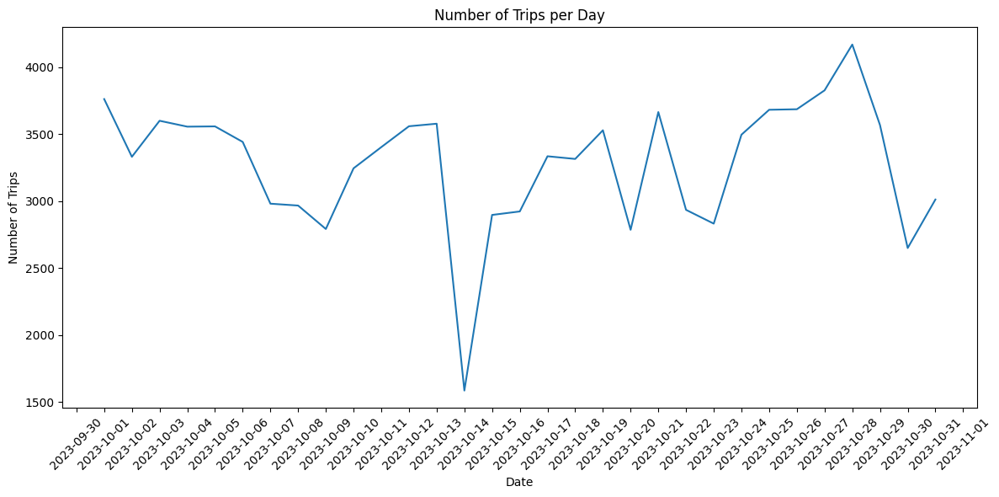

In [ ]:
# EDA of capital bikesahre data

# Line plots for number of trips per day
cap_bks_oct['started_at'] = pd.to_datetime(cap_bks_oct['started_at'])
cap_bks_oct['ended_at'] = pd.to_datetime(cap_bks_oct['ended_at'])
cap_bks_oct['start_date'] = cap_bks_oct['started_at'].dt.date
trips_per_day = cap_bks_oct['start_date'].value_counts().sort_index()

plt.figure(figsize=(12, 6))
sns.lineplot(x=trips_per_day.index, y=trips_per_day.values)
plt.title('Number of Trips per Day')
plt.xlabel('Date')
plt.ylabel('Number of Trips')
plt.xticks(rotation=45)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=1))
plt.tight_layout()
plt.show()

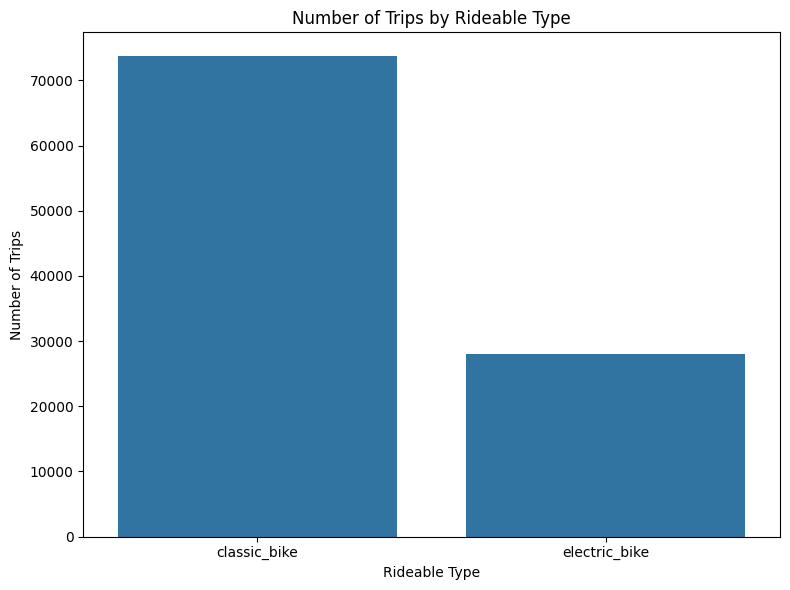

In [ ]:
# Bar chart for number of trips by rideable type
trips_by_rideable_type = cap_bks_oct['rideable_type'].value_counts()

plt.figure(figsize=(8, 6))
sns.barplot(x=trips_by_rideable_type.index, y=trips_by_rideable_type.values)
plt.title('Number of Trips by Rideable Type')
plt.xlabel('Rideable Type')
plt.ylabel('Number of Trips')
plt.tight_layout()
plt.show()

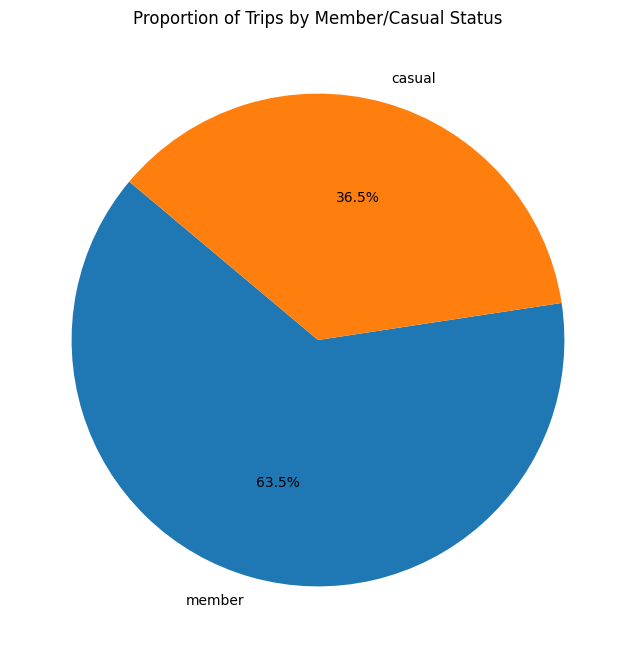

In [ ]:
# Count plot of trips based member status
trips_by_member_casual = cap_bks_oct['member_casual'].value_counts()

plt.figure(figsize=(8, 8))
plt.pie(trips_by_member_casual, labels=trips_by_member_casual.index, autopct='%1.1f%%', startangle=140)
plt.title('Proportion of Trips by Member/Casual Status')
plt.show()

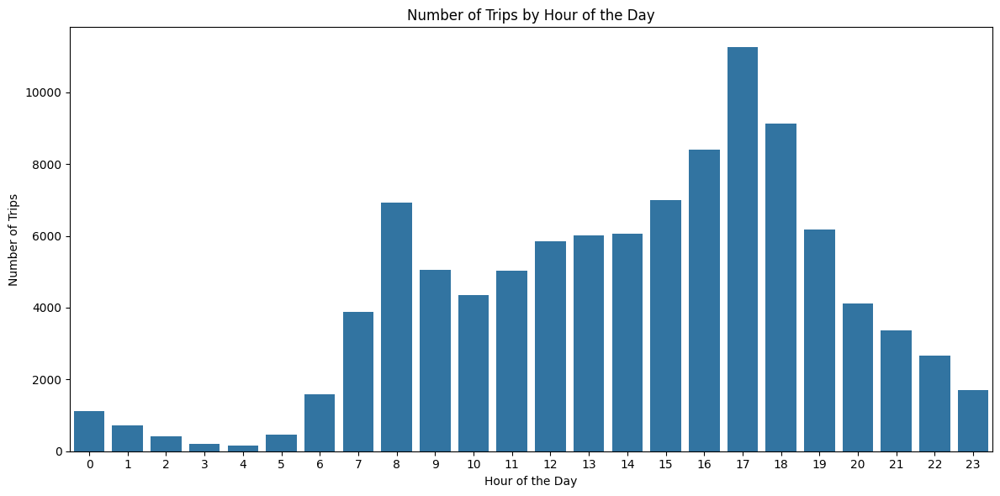

In [ ]:
# Count plot of number of trips by hour of the day
cap_bks_oct['start_hour'] = cap_bks_oct['started_at'].dt.hour
trips_by_hour = cap_bks_oct['start_hour'].value_counts().sort_index()

plt.figure(figsize=(12, 6))
sns.barplot(x=trips_by_hour.index, y=trips_by_hour.values)
plt.title('Number of Trips by Hour of the Day')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Trips')
plt.tight_layout()
plt.show()

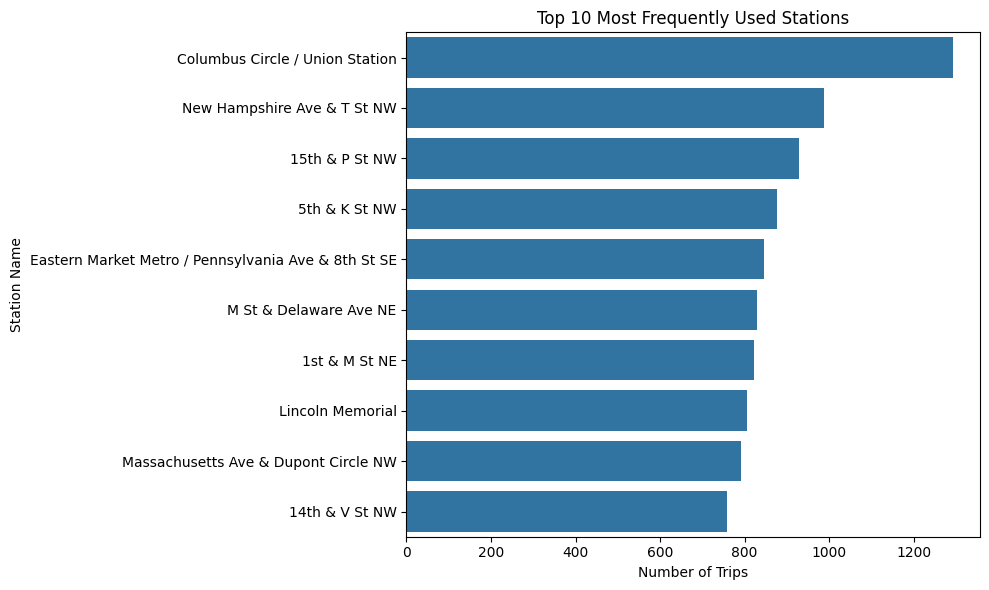

In [ ]:
# Bar plot of most frequent used stations
most_used_stations = cap_bks_oct['start_station_name'].value_counts().nlargest(10)

plt.figure(figsize=(10, 6))
sns.barplot(y=most_used_stations.index, x=most_used_stations.values, orient='h')
plt.title('Top 10 Most Frequently Used Stations')
plt.xlabel('Number of Trips')
plt.ylabel('Station Name')
plt.tight_layout()
plt.show()

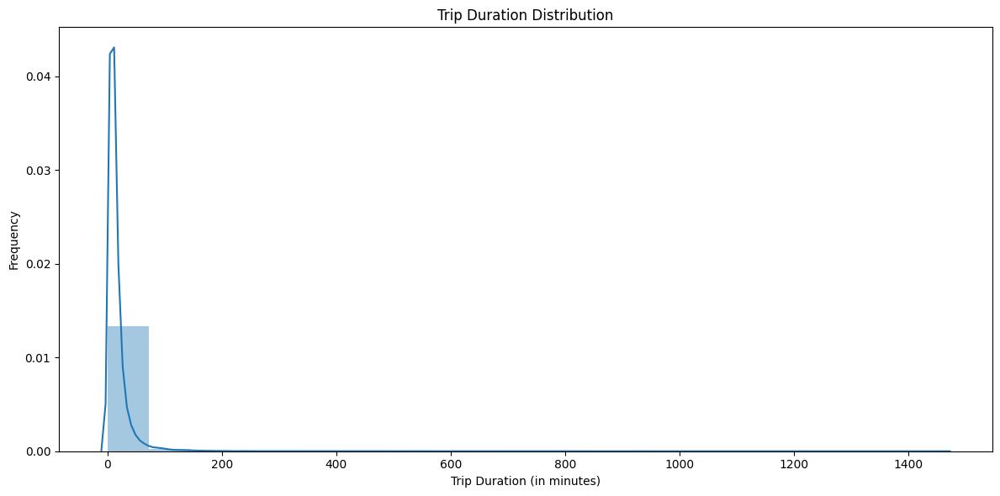

In [ ]:
# Histogram of trip duration
cap_bks_oct['trip_duration'] = (cap_bks_oct['ended_at'] - cap_bks_oct['started_at']).dt.total_seconds() / 60

plt.figure(figsize=(12, 6))
sns.distplot(cap_bks_oct['trip_duration'], kde=True, bins=20)
plt.title('Trip Duration Distribution')
plt.xlabel('Trip Duration (in minutes)')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

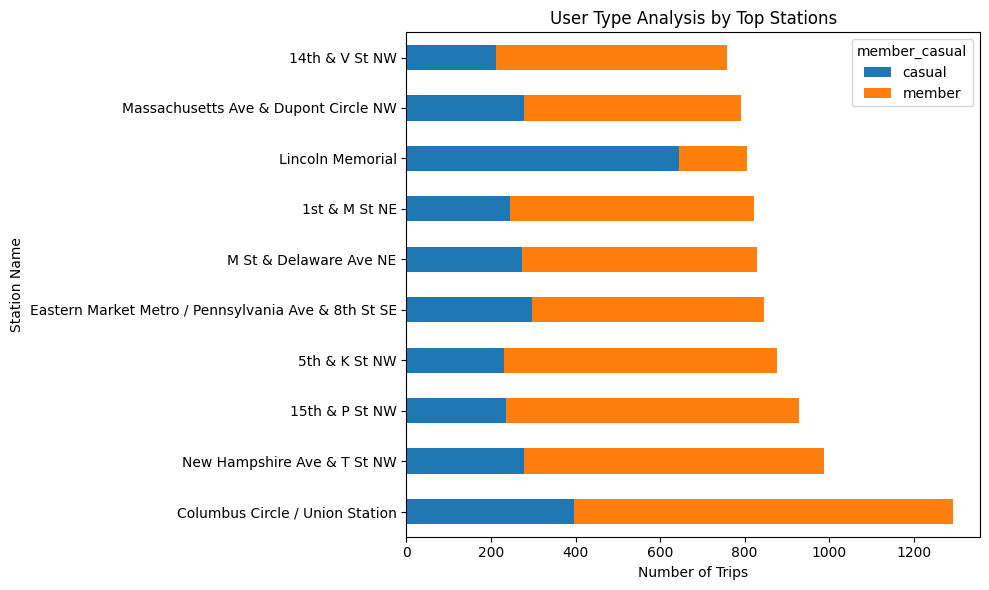

In [ ]:
# Stacked bar plot of trips by station and user type
user_type_by_station = cap_bks_oct.groupby(['start_station_name', 'member_casual']).size().unstack().fillna(0)
top_stations = user_type_by_station.sum(axis=1).nlargest(10).index
top_stations_data = user_type_by_station.loc[top_stations]

top_stations_data.plot(kind='barh', stacked=True, figsize=(10, 6))
plt.title('User Type Analysis by Top Stations')
plt.xlabel('Number of Trips')
plt.ylabel('Station Name')
plt.tight_layout()
plt.show()

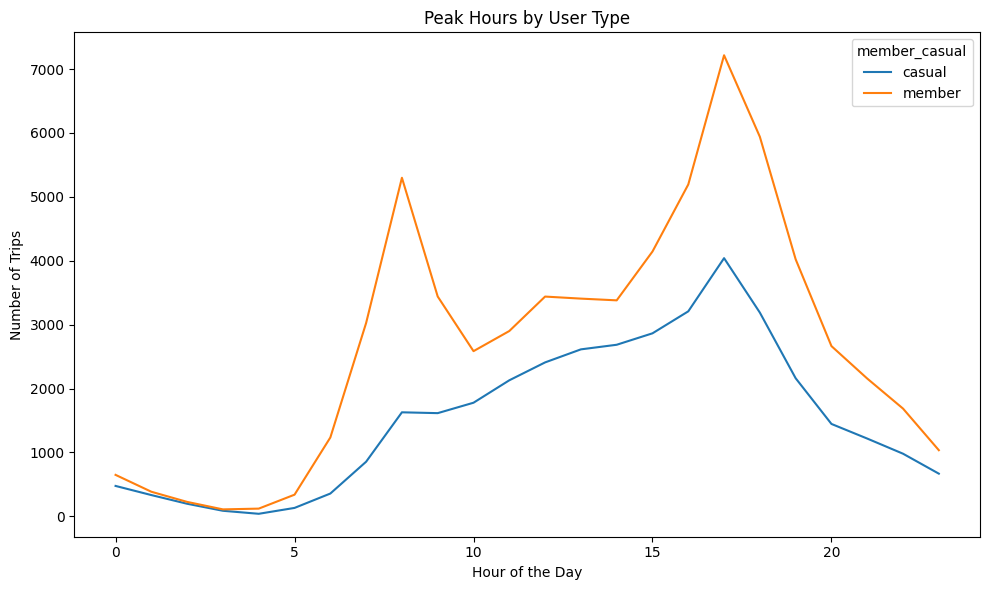

In [ ]:
# Line plot of peak hours by user type
peak_hours_by_user_type = cap_bks_oct.groupby(['start_hour', 'member_casual']).size().unstack().fillna(0)

peak_hours_by_user_type.plot(kind='line', figsize=(10, 6))
plt.title('Peak Hours by User Type')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Trips')
plt.tight_layout()
plt.show()

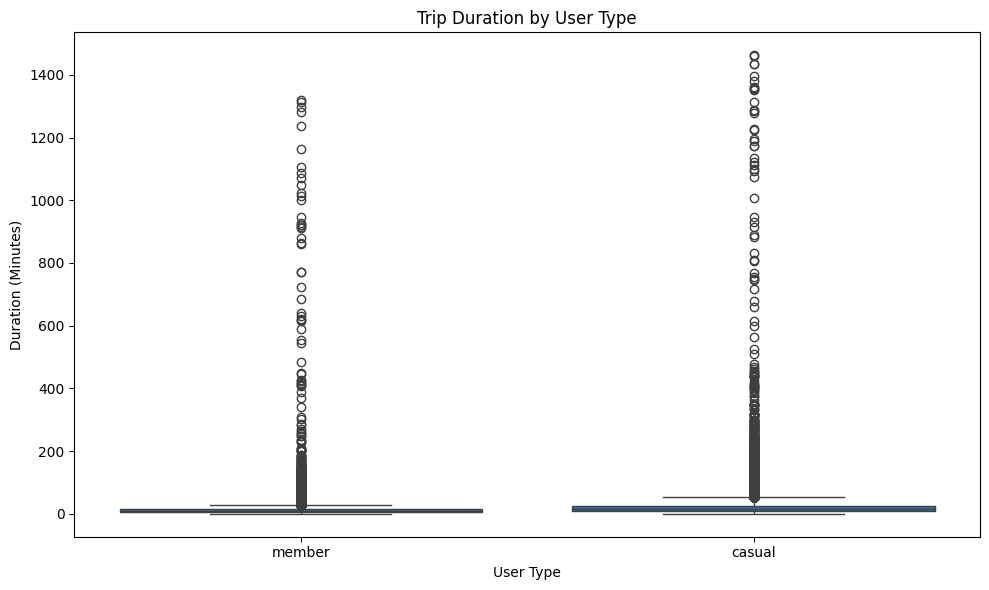

In [ ]:
# Box plot for trip durations by user type
plt.figure(figsize=(10, 6))
sns.boxplot(data=cap_bks_oct, x='member_casual', y='trip_duration')
plt.title('Trip Duration by User Type')
plt.xlabel('User Type')
plt.ylabel('Duration (Minutes)')
plt.tight_layout()
plt.show()

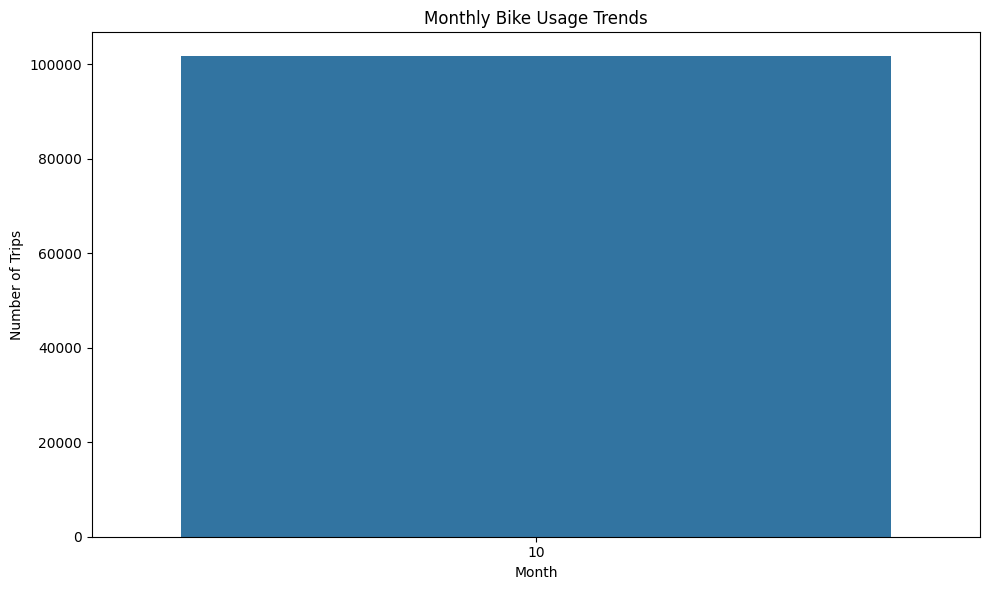

In [ ]:
# Bar plot of monthly trips
cap_bks_oct['start_month'] = cap_bks_oct['started_at'].dt.month
monthly_trips = cap_bks_oct.groupby('start_month').size()

plt.figure(figsize=(10, 6))
sns.barplot(x=monthly_trips.index, y=monthly_trips.values)
plt.title('Monthly Bike Usage Trends')
plt.xlabel('Month')
plt.ylabel('Number of Trips')
plt.tight_layout()
plt.show()

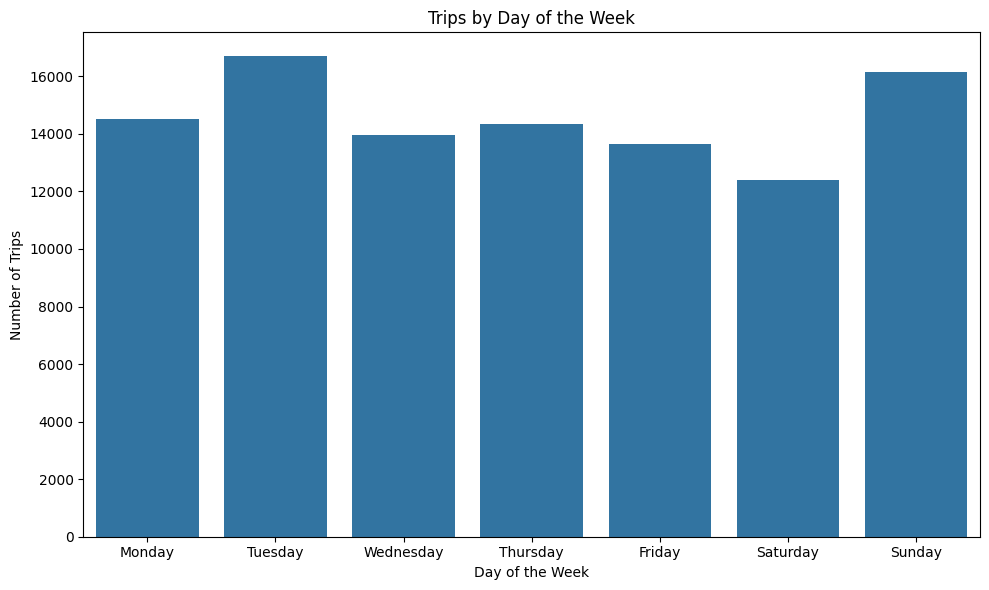

In [ ]:
# Bar chart for trips by day of the week
cap_bks_oct['day_of_week'] = cap_bks_oct['started_at'].dt.day_name()
trips_by_day_of_week = cap_bks_oct['day_of_week'].value_counts()

plt.figure(figsize=(10, 6))
sns.barplot(x=trips_by_day_of_week.index, y=trips_by_day_of_week.values, order=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
plt.title('Trips by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Number of Trips')
plt.tight_layout()
plt.show()

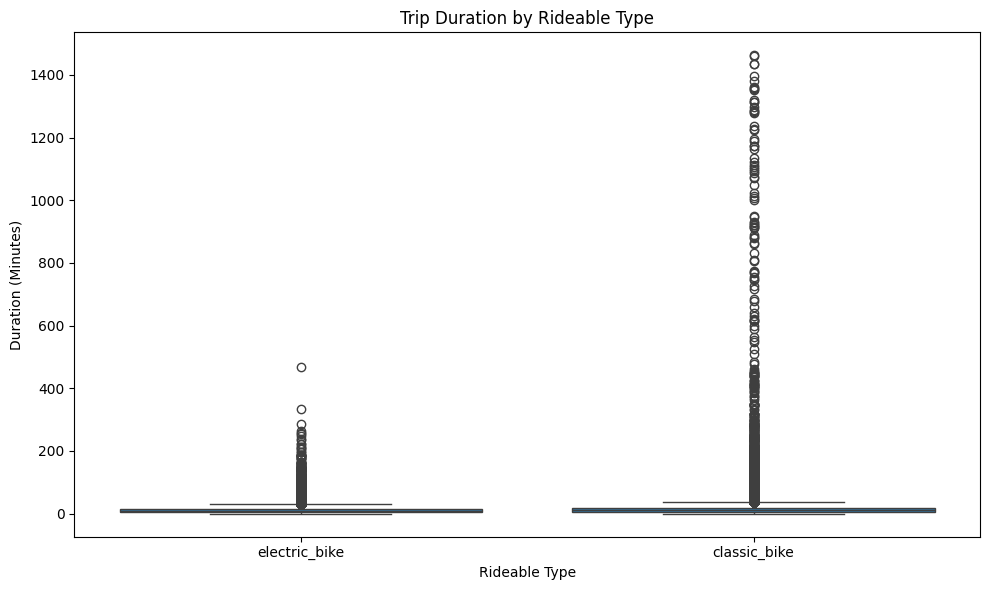

In [ ]:
# Box plot for trip durations by rideable type
plt.figure(figsize=(10, 6))
sns.boxplot(data=cap_bks_oct, x='rideable_type', y='trip_duration')
plt.title('Trip Duration by Rideable Type')
plt.xlabel('Rideable Type')
plt.ylabel('Duration (Minutes)')
plt.tight_layout()
plt.show()

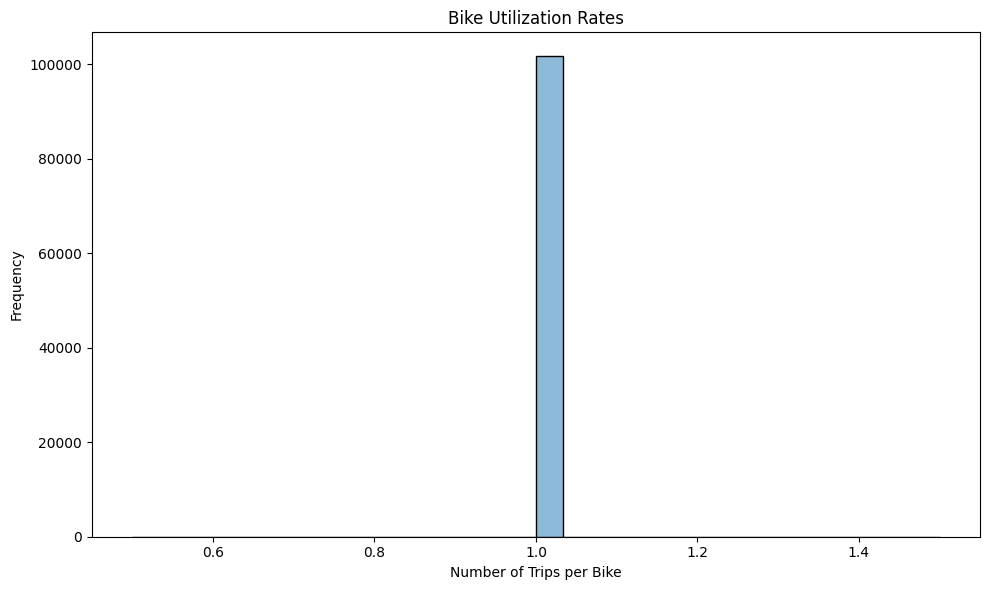

In [ ]:
#%%
# Histogram for ride utilization
bike_utilization = cap_bks_oct['ride_id'].value_counts()

plt.figure(figsize=(10, 6))
sns.histplot(bike_utilization, bins=30, kde=True)
plt.title('Bike Utilization Rates')
plt.xlabel('Number of Trips per Bike')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

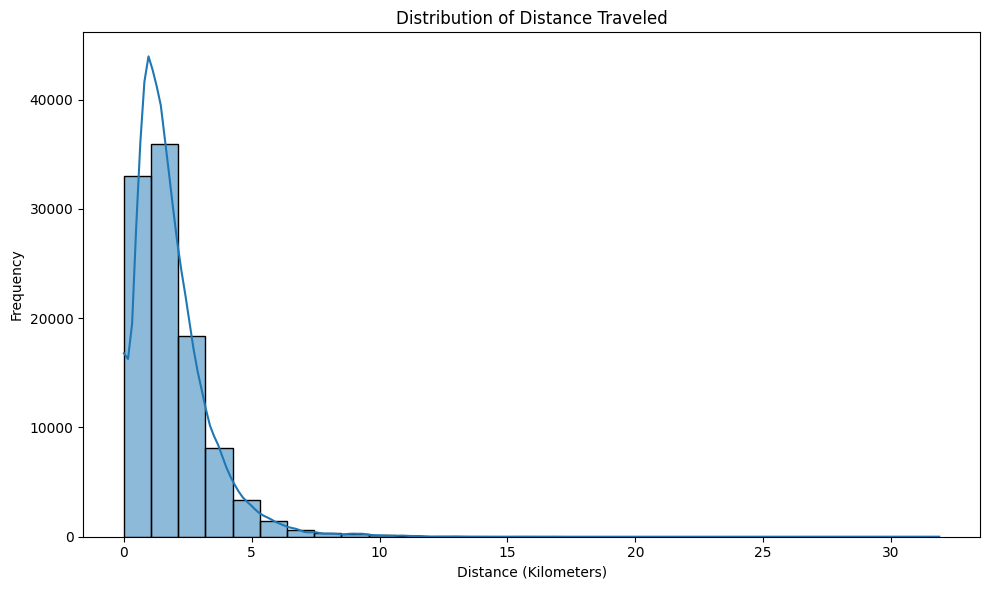

In [ ]:
# Histogram for the distance traveled
def calculate_distance(row):
    start_point = (row['start_lat'], row['start_lng'])
    end_point = (row['end_lat'], row['end_lng'])
    return geodesic(start_point, end_point).kilometers

cap_bks_oct['distance'] = cap_bks_oct.apply(calculate_distance, axis=1)

plt.figure(figsize=(10, 6))
sns.histplot(cap_bks_oct['distance'], bins=30, kde=True)
plt.title('Distribution of Distance Traveled')
plt.xlabel('Distance (Kilometers)')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()


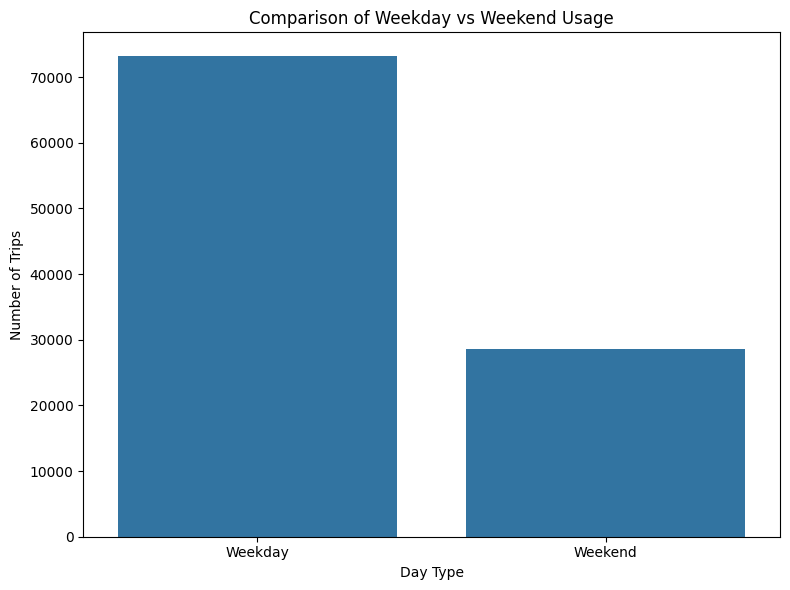

In [ ]:
# Bar chart for weekday vs weekend usage
cap_bks_oct['day_type'] = cap_bks_oct['day_of_week'].apply(lambda x: 'Weekend' if x in ['Saturday', 'Sunday'] else 'Weekday')

# Count trips by day type
trips_by_day_type = cap_bks_oct['day_type'].value_counts()

plt.figure(figsize=(8, 6))
sns.barplot(x=trips_by_day_type.index, y=trips_by_day_type.values)
plt.title('Comparison of Weekday vs Weekend Usage')
plt.xlabel('Day Type')
plt.ylabel('Number of Trips')
plt.tight_layout()
plt.show()

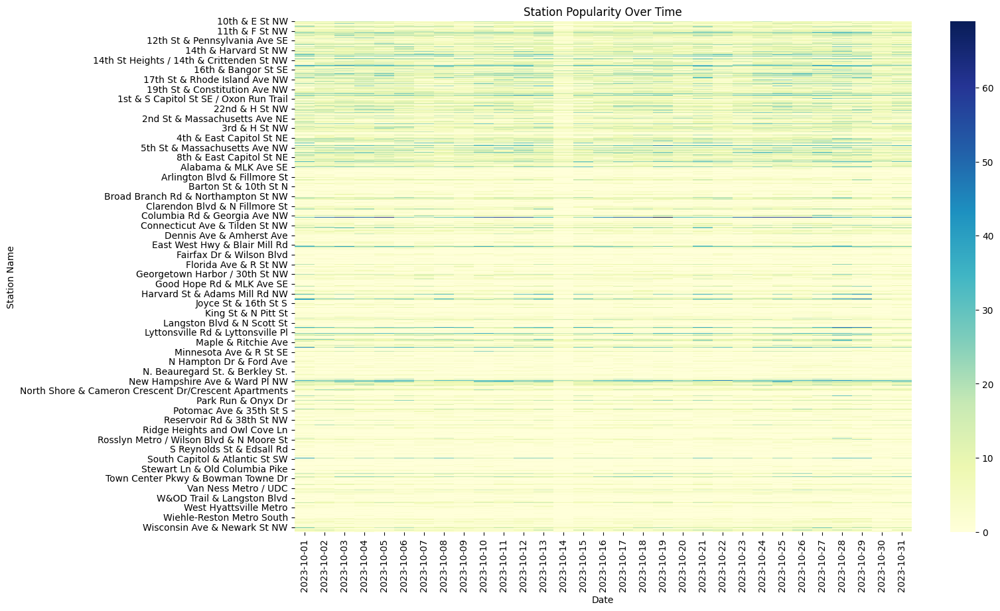

In [ ]:
# Heatmap of station popularity over time
station_popularity = cap_bks_oct.groupby(['start_station_name', cap_bks_oct['started_at'].dt.date]).size().unstack(fill_value=0)

plt.figure(figsize=(15, 10))
sns.heatmap(station_popularity, cmap="YlGnBu")
plt.title('Station Popularity Over Time')
plt.xlabel('Date')
plt.ylabel('Station Name')
plt.show()

In [ ]:
# Load metro data of Washington DC
metro_data = pd.read_csv('Metro_Stations_Regional_Updated.csv')
metro_data.head()

,X,Y,NAME,ADDRESS,LINE
0,-76.911466,38.826454,Branch Ave,"4704 OLD SOPER ROAD, SUITLAND, MD",green
1,-77.053670,38.814151,Braddock Road,"700 N. WEST ST., ALEXANDRIA, VA","blue, yellow"
2,-77.060813,38.806594,King St-Old Town,"1900 KING STREET, ALEXANDRIA, VA","blue, yellow"
3,-77.070877,38.800433,Eisenhower Ave,"2400 EISENHOWER AVENUE, ALEXANDRIA, VA",yellow
4,-77.075208,38.793924,Huntington,"2701 HUNTINGTON AVENUE, ALEXANDRIA, VA",yellow


           X          Y              NAME                                 ADDRESS          LINE
0 -76.911466  38.826454        Branch Ave       4704 OLD SOPER ROAD, SUITLAND, MD         green
1 -77.053670  38.814151     Braddock Road         700 N. WEST ST., ALEXANDRIA, VA  blue, yellow
2 -77.060813  38.806594  King St-Old Town        1900 KING STREET, ALEXANDRIA, VA  blue, yellow
3 -77.070877  38.800433    Eisenhower Ave  2400 EISENHOWER AVENUE, ALEXANDRIA, VA        yellow
4 -77.075208  38.793924        Huntington  2701 HUNTINGTON AVENUE, ALEXANDRIA, VA        yellow
(98, 5)
X          0
Y          0
NAME       0
ADDRESS    0
LINE       0
dtype: int64
0
X          float64
Y          float64
NAME        object
ADDRESS     object
LINE        object
dtype: object
X          97
Y          98
NAME       98
ADDRESS    98
LINE       14
dtype: int64
           X          Y              NAME                            ADDRESS     LINE
0 -76.911466  38.826454        Branch Ave  4704 OLD SOPER 

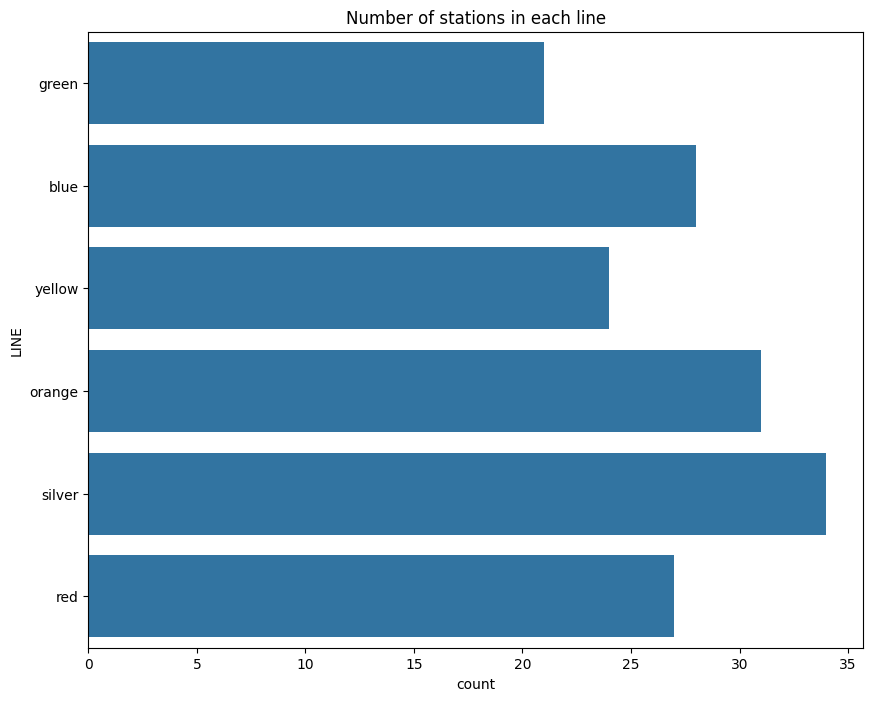

           X          Y              NAME                            ADDRESS    LINE             LOCATION         CITY STATE
0 -76.911466  38.826454        Branch Ave  4704 OLD SOPER ROAD, SUITLAND, MD   green  4704 OLD SOPER ROAD     SUITLAND    MD
1 -77.053670  38.814151     Braddock Road    700 N. WEST ST., ALEXANDRIA, VA    blue      700 N. WEST ST.   ALEXANDRIA    VA
1 -77.053670  38.814151     Braddock Road    700 N. WEST ST., ALEXANDRIA, VA  yellow      700 N. WEST ST.   ALEXANDRIA    VA
2 -77.060813  38.806594  King St-Old Town   1900 KING STREET, ALEXANDRIA, VA    blue     1900 KING STREET   ALEXANDRIA    VA
2 -77.060813  38.806594  King St-Old Town   1900 KING STREET, ALEXANDRIA, VA  yellow     1900 KING STREET   ALEXANDRIA    VA


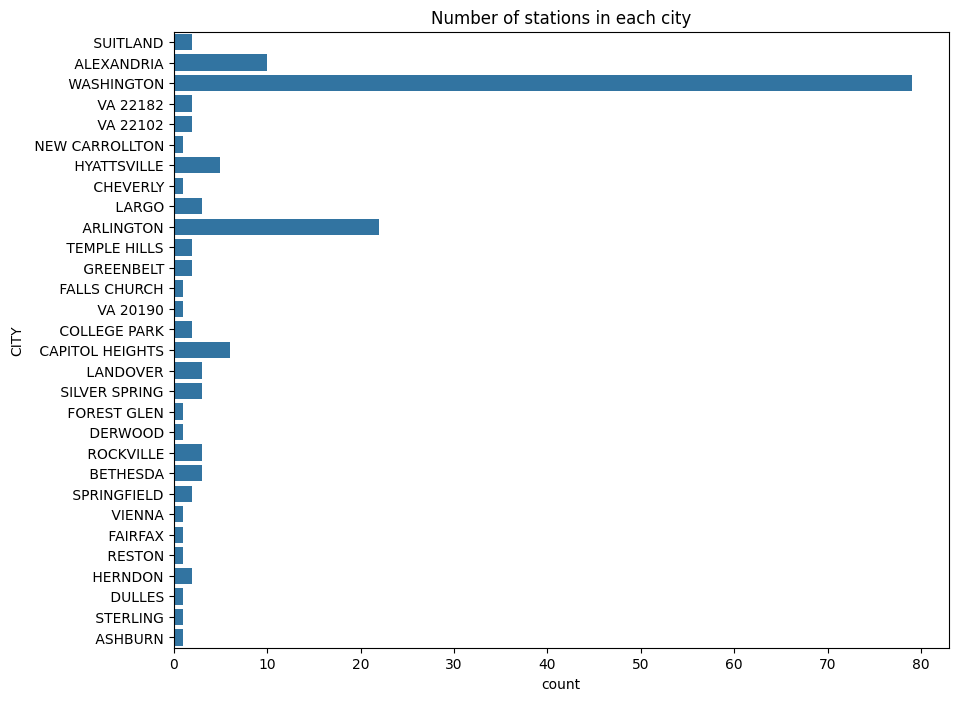

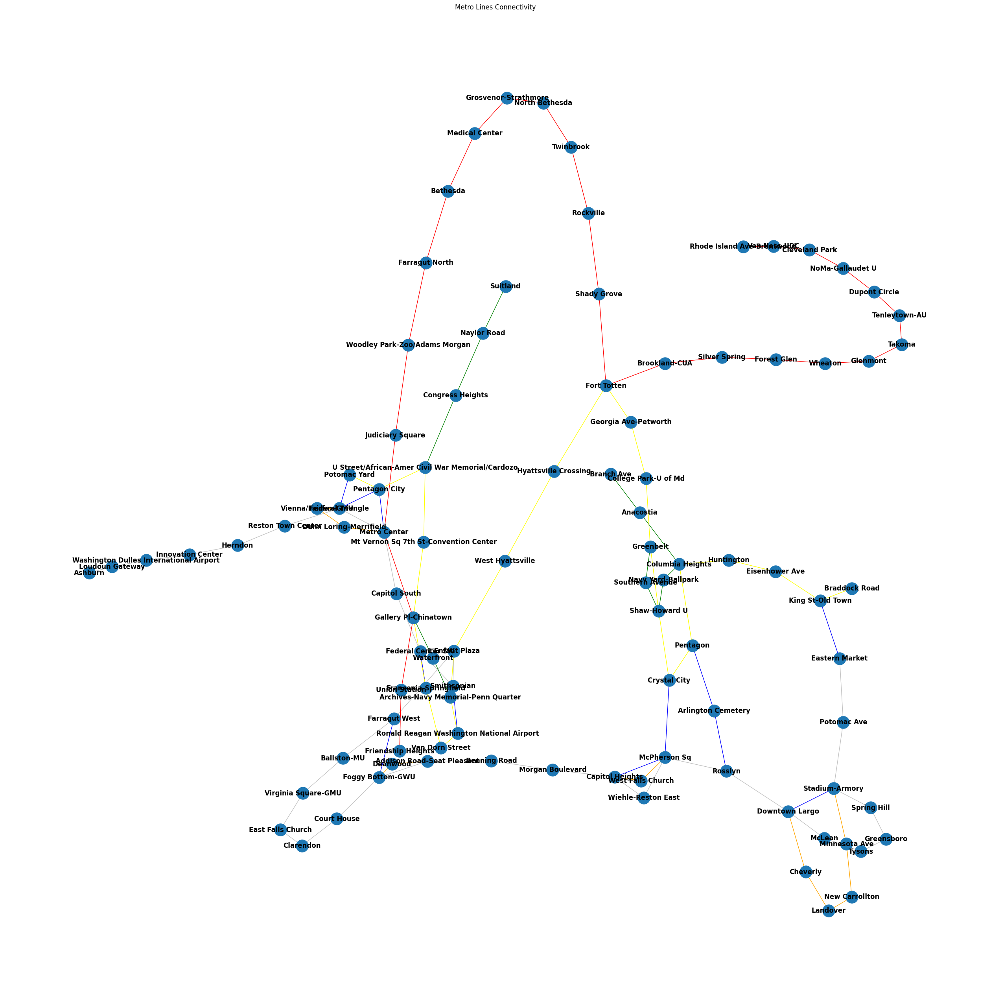

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx

# Read in the data
df = pd.read_csv("Metro_Stations_Regional_Updated.csv")
print(df.head().to_string())
print(df.shape)

# The dataset columns and values

# Check for missing values
print(df.isnull().sum())

# Check for duplicates
print(df.duplicated().sum())

# Check for data types
print(df.dtypes)

# Check for unique values
print(df.nunique())

df_new = df.assign(LINE=df.LINE.str.split(',')).explode('LINE')
print(df_new.head().to_string())

df_new['LINE'] = df_new['LINE'].str.strip()
df_new['LINE'] = df_new['LINE'].replace(['grn', 'yllw', 'slvr'], ['green', 'yellow', 'silver'])
print(df_new.head().to_string())

# plot the number of stations in each line
plt.figure(figsize=(10, 8))
sns.countplot(y='LINE', data=df_new)
plt.title('Number of stations in each line')
plt.show()

# number of station per by city and have address column only
# split the address column into city and state
df_new[['LOCATION', 'CITY', 'STATE']] = df_new['ADDRESS'].str.split(',', expand=True)
print(df_new.head().to_string())

# plot the histogram with kde for the number of stations in each city
plt.figure(figsize=(10, 8))
sns.countplot(y='CITY', data=df_new)
plt.title('Number of stations in each city')
plt.show()



# Creating a graph based on connections between stations within the same line
G = nx.Graph()
line_colors = {'green': 'green', 'blue': 'blue', 'yellow': 'yellow', 'red': 'red', 'orange': 'orange',
               'silver': 'silver'}

for line, sub_df in df_new.groupby('LINE'):
    connections = list(zip(sub_df['NAME'][:-1], sub_df['NAME'][1:]))
    G.add_edges_from(connections, color=line_colors[line])

# Plotting the network graph with different colors for each line
plt.figure(figsize=(25, 25))
pos = nx.spring_layout(G)
edge_colors = [G[u][v]['color'] for u, v in G.edges()]
nx.draw(G, pos, with_labels=True, node_size=500, font_weight='bold', edge_color=edge_colors)
plt.title('Metro Lines Connectivity')
plt.show()

In [ ]:
import folium

In [ ]:
map_center = [38.9, -77.1]  # Adjust these coordinates to center the map as needed
dmv_map = folium.Map(location=map_center, zoom_start=11)

# Add markers for each metro station
for index, station in df.iterrows():
    folium.Marker([station['Y'], station['X']], popup=station['NAME']).add_to(dmv_map)
dmv_map.save('dmv_map.html')
dmv_map

              X             Y  EGIS_ID   REG_ID  BSTP_GEO_ID BSTP_OPS_TCD           BSTP_EFF_DATE BSTP_TCD               AT_STR            ON_STR  BSTP_HDG BSTP_POS_TCD           BSTP_LDC                        BSTP_MSG_TEXT   BSTP_LON   BSTP_LAT BSTP_LAT_LON_TCD BSTP_INV_SYR_TCD       BSTP_INV_SRV_DATE  BSTP_BNH_CNT BSTP_BST_TCD BSTP_IFC_OWN BSTP_HAS_BKRS BSTP_HAS_PRS BSTP_HAS_PVM BSTP_HAS_PRM BSTP_PDP_SIZE_TCD BSTP_PDP_MTR_TCD BSTP_PDP_OBS_TCD BSTP_PDP_HAS_CCN BSTP_HAS_BDR_PDP BSTP_BDR_PDP_OBS  BSTP_SWK_WDT BSTP_SWK_HAS_CCN BSTP_SWK_HAS_PPC BSTP_SWK_SLP_WVL BSTP_SWK_OBS_TCD BSTP_SWK_IPD_TCD  ONS_CRP_SLP ONS_CRP OFS_CRP AT_STR_ABS_CRP AT_STR_OSS_CRP ONS_CWK OFS_CWK AT_STR_ABS_CWK AT_STR_OSS_CWK ON_STR_STS_OR_TFL ON_STR_PDC_SGL AT_STR_PDC_SGL BSTP_PRK_RST_TCD  BSTP_NPK_ZNE_LTH CNF_NPK_SNS STR_LGT_WTN_30_FT BSTP_HAS_LED_DSP BSTP_ACC_RATING BSTP_BRDG_STP BSTP_HAS_LUM_SIGN BSTP_HAS_PWR_SRC METRO_ACCS_STP  WARD_ID  ANC_ID    SMD_ID   ROUTEID     MEASURE  OFFSET                          BLO

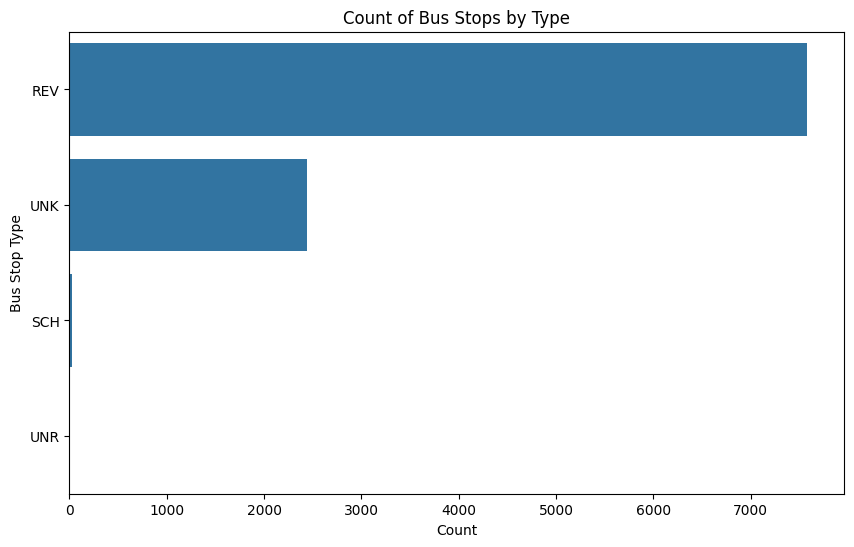

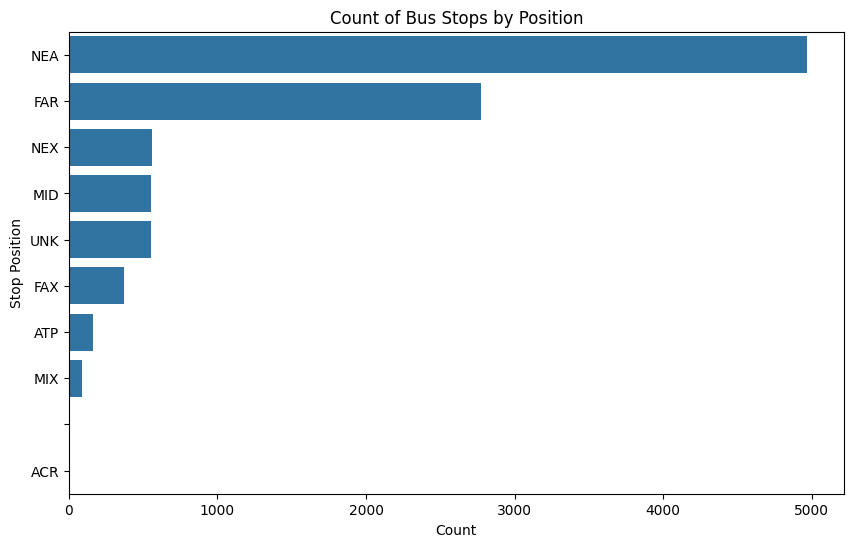

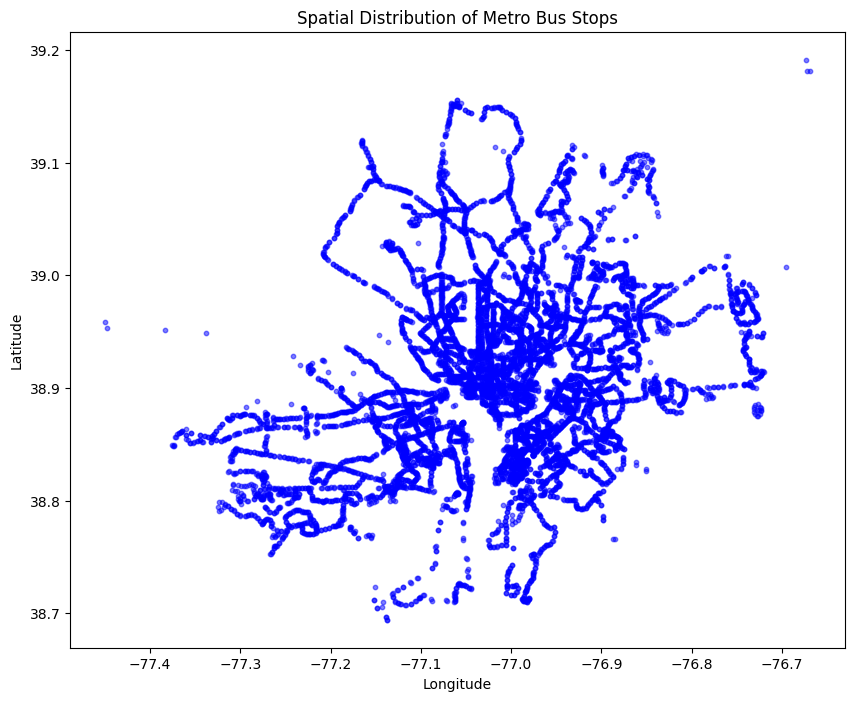

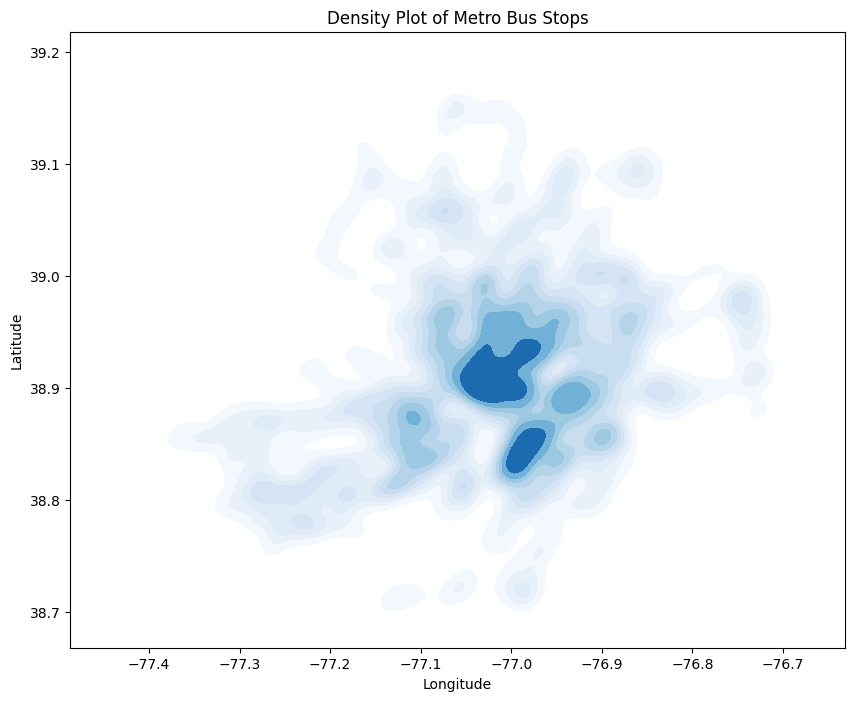

Interactive Metro Bus Stops Map saved as 'metro_bus_stops_map.html'.


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium

# Load the Metro Bus data
metro_bus_df = pd.read_csv("Metro_Bus_Stops.csv")

# Display the first few rows
print(metro_bus_df.head().to_string())
print("Shape of the dataset:", metro_bus_df.shape)

# Check for missing values
print("Missing Values:\n", metro_bus_df.isnull().sum())

# Check for duplicates
print("Number of duplicate rows:", metro_bus_df.duplicated().sum())

# Data types of each column
print("Data Types:\n", metro_bus_df.dtypes)

# Unique values per column
print("Unique Values:\n", metro_bus_df.nunique())

# Analyze specific columns
print("Unique Bus Stop Types:", metro_bus_df['BSTP_TCD'].unique())  # Bus Stop Types
print("Unique Stop Position Types:", metro_bus_df['BSTP_POS_TCD'].unique())  # Stop Position Types

# Distribution of bus stop types
plt.figure(figsize=(10, 6))
sns.countplot(y='BSTP_TCD', data=metro_bus_df, order=metro_bus_df['BSTP_TCD'].value_counts().index)
plt.title('Count of Bus Stops by Type')
plt.xlabel('Count')
plt.ylabel('Bus Stop Type')
plt.show()

# Distribution of stop positions
plt.figure(figsize=(10, 6))
sns.countplot(y='BSTP_POS_TCD', data=metro_bus_df, order=metro_bus_df['BSTP_POS_TCD'].value_counts().index)
plt.title('Count of Bus Stops by Position')
plt.xlabel('Count')
plt.ylabel('Stop Position')
plt.show()

# Extract the 'CITY' column from the 'BSTP_MSG_TEXT' or split the ADDRESS if it exists
if 'ADDRESS' in metro_bus_df.columns:
    metro_bus_df[['LOCATION', 'CITY', 'STATE']] = metro_bus_df['ADDRESS'].str.split(',', expand=True)
    print("City and State columns extracted:")
    print(metro_bus_df[['CITY', 'STATE']].head())

# Histogram of bus stops by City (if CITY column exists)
if 'CITY' in metro_bus_df.columns:
    plt.figure(figsize=(10, 8))
    sns.countplot(y='CITY', data=metro_bus_df, order=metro_bus_df['CITY'].value_counts().index)
    plt.title('Number of Bus Stops by City')
    plt.xlabel('Count')
    plt.ylabel('City')
    plt.show()

# Spatial Distribution of Bus Stops using Latitude and Longitude
plt.figure(figsize=(10, 8))
plt.scatter(metro_bus_df['BSTP_LON'], metro_bus_df['BSTP_LAT'], c='blue', alpha=0.5, s=10)
plt.title('Spatial Distribution of Metro Bus Stops')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

# Density Plot of Bus Stops
plt.figure(figsize=(10, 8))
sns.kdeplot(x=metro_bus_df['BSTP_LON'], y=metro_bus_df['BSTP_LAT'], cmap="Blues", fill=True, bw_adjust=0.5)
plt.title("Density Plot of Metro Bus Stops")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

# Interactive Folium Map for Metro Bus Stops
bus_map = folium.Map(location=[38.9, -77.1], zoom_start=11)  # Centered in the DMV area

for index, bus_stop in metro_bus_df.iterrows():
    folium.Marker(
        [bus_stop['BSTP_LAT'], bus_stop['BSTP_LON']],
        popup=bus_stop['BSTP_MSG_TEXT']
    ).add_to(bus_map)

# Save and display the map
bus_map.save("metro_bus_stops_map.html")
print("Interactive Metro Bus Stops Map saved as 'metro_bus_stops_map.html'.")
bus_map

In [ ]:
#------------------------------------------------------------------------------------------
# Main Task No. 1: Combined analysis by integrating capital bike share data with metro data
#------------------------------------------------------------------------------------------

# 1. Nearest Metro Station Analysis
print(metro_data.columns)

def find_nearest_metro(bike_coords, metro_coords, metro_df):
    neigh = NearestNeighbors(n_neighbors=1)
    neigh.fit(metro_coords)
    distances, indices = neigh.kneighbors(bike_coords)

    nearest_metro_stations = metro_df.iloc[indices.flatten()]["NAME"]
    return nearest_metro_stations.values, distances.flatten()

bike_start_coords = cap_bks_oct[['start_lat', 'start_lng']].values
bike_end_coords = cap_bks_oct[['end_lat', 'end_lng']].values
metro_coords = metro_data[['Y', 'X']].values

nearest_metro_start, start_distances = find_nearest_metro(bike_start_coords, metro_coords, metro_data)
nearest_metro_end, end_distances = find_nearest_metro(bike_end_coords, metro_coords, metro_data)

cap_bks_oct['nearest_start_metro'] = nearest_metro_start
cap_bks_oct['start_metro_distance'] = start_distances
cap_bks_oct['nearest_end_metro'] = nearest_metro_end
cap_bks_oct['end_metro_distance'] = end_distances

cap_bks_oct['start_metro_distance'] = cap_bks_oct['start_metro_distance'].round(2)
cap_bks_oct['end_metro_distance'] = cap_bks_oct['end_metro_distance'].round(2)

print(cap_bks_oct.head())

Index(['X', 'Y', 'NAME', 'ADDRESS', 'LINE'], dtype='object')
             ride_id  rideable_type          started_at            ended_at  \
0   CB181909FC05004F  electric_bike 2023-10-29 09:10:14 2023-10-29 09:25:19   
4   C3CD670D215D5202   classic_bike 2023-10-23 18:30:45 2023-10-23 18:43:23   
8   DE5E49E0F8EF832A   classic_bike 2023-10-01 19:55:17 2023-10-01 20:04:07   
12  28394A68430BA6FA  electric_bike 2023-10-27 06:24:10 2023-10-27 06:32:23   
16  B80203E5C63A0317   classic_bike 2023-10-22 09:53:25 2023-10-22 09:56:55   

                              start_station_name  start_station_id  \
0                           11th & Clifton St NW           31136.0   
4   W&OD Trail/Sunset Hills Rd & Isaac Newton Sq           32220.0   
8             36th & Calvert St NW / Glover Park           31304.0   
12                    The Mall at Prince Georges           32422.0   
16                          11th & Clifton St NW           31136.0   

                                     end_st

In [ ]:
# 2. Bike Usage Patterns in Relation to Nearby Metro Stations
near_metro_threshold = 0.5
cap_bks_oct['start_near_metro'] = cap_bks_oct['start_metro_distance'] <= near_metro_threshold
cap_bks_oct['end_near_metro'] = cap_bks_oct['end_metro_distance'] <= near_metro_threshold

# Counting trips starting or ending near a metro
start_near_metro_count = cap_bks_oct['start_near_metro'].sum()
end_near_metro_count = cap_bks_oct['end_near_metro'].sum()

cap_bks_oct['ended_at'] = pd.to_datetime(cap_bks_oct['ended_at'])
cap_bks_oct['started_at'] = pd.to_datetime(cap_bks_oct['started_at'])

cap_bks_oct['trip_duration'] = (cap_bks_oct['ended_at'] - cap_bks_oct['started_at']).dt.total_seconds() / 60

In [ ]:
# 3. Relationship Between Trip Duration and Proximity to Metro Stations
avg_duration_near_metro_start = cap_bks_oct[cap_bks_oct['start_near_metro']]['trip_duration'].mean()
avg_duration_far_metro_start = cap_bks_oct[~cap_bks_oct['start_near_metro']]['trip_duration'].mean()
avg_duration_near_metro_end = cap_bks_oct[cap_bks_oct['end_near_metro']]['trip_duration'].mean()
avg_duration_far_metro_end = cap_bks_oct[~cap_bks_oct['end_near_metro']]['trip_duration'].mean()

In [ ]:
# 4. Bike usage patterns on different metro lines
metro_lines = metro_data.set_index('NAME')['LINE'].to_dict()
cap_bks_oct['start_metro_line'] = cap_bks_oct['nearest_start_metro'].map(metro_lines)
cap_bks_oct['end_metro_line'] = cap_bks_oct['nearest_end_metro'].map(metro_lines)

In [ ]:
# 5. Most popular metro stations for bike users
start_station_popularity = cap_bks_oct[cap_bks_oct['start_near_metro']]['nearest_start_metro'].value_counts()
end_station_popularity = cap_bks_oct[cap_bks_oct['end_near_metro']]['nearest_end_metro'].value_counts()
combined_station_popularity = start_station_popularity.add(end_station_popularity, fill_value=0)
most_popular_stations = combined_station_popularity.sort_values(ascending=False)
print("Most Popular Metro Stations for Bike Users:")
print(most_popular_stations.head(10))

Most Popular Metro Stations for Bike Users:
Dupont Circle                                       15462
Foggy Bottom-GWU                                    14081
NoMa-Gallaudet U                                    13361
U Street/African-Amer Civil War Memorial/Cardozo    10840
Union Station                                       10249
Columbia Heights                                     9826
Mt Vernon Sq 7th St-Convention Center                8808
McPherson Sq                                         7766
Rosslyn                                              7700
Eastern Market                                       6809
Name: count, dtype: int64


In [ ]:
# Load metrobus data of Washington DC
bus_stops_data = pd.read_csv('Metro_Bus_Stops.csv')
bus_stops_data.head()

,X,Y,EGIS_ID,REG_ID,BSTP_GEO_ID,BSTP_OPS_TCD,BSTP_EFF_DATE,BSTP_TCD,AT_STR,ON_STR,...,SE_ANNO_CAD_DATA,GLOBALID,CREATOR,CREATED,EDITOR,EDITED,OBJECTID,SNOWPRIORITY,BSTP_OPS_FTU_TCD,MSTN_ID
0,-8.581259e+06,4.715817e+06,1311739,1003448,15663,PRS,2011/08/22 04:00:00+00,UNK,44TH ST NW,JENIFER ST NW,...,NaN,{CFF25BD1-E9E8-44CD-81D6-975FE646753F},JLAY,2024/01/19 02:55:48+00,JLAY,2024/01/19 02:55:48+00,54845,NaN,NON,NaN
1,-8.540493e+06,4.714288e+06,1310541,3003035,14833,PRS,2001/12/30 05:00:00+00,REV,HARBOUR WAY,MITCHELLVILLE RD,...,NaN,{8E670BA7-FB63-4CAC-B9FC-C0901E266303},JLAY,2024/01/19 02:55:48+00,JLAY,2024/01/19 02:55:48+00,54846,NaN,NON,NaN
2,-8.591135e+06,4.698290e+06,1302469,5000849,2134,PRS,1901/01/01 05:00:00+00,REV,SLEEPY HOLLOW MANOR,COLUMBIA PIKE,...,NaN,{22649B1B-617C-4511-9786-D465C7142788},JLAY,2024/01/19 02:55:48+00,JLAY,2024/01/19 02:55:48+00,54847,NaN,NON,NaN
3,-8.577431e+06,4.682321e+06,1305286,5001858,11889,PRS,1974/11/25 05:00:00+00,REV,CUSHMAN PL,WAYNEWOOD BLVD,...,NaN,{AE0E1A3F-7C1D-4410-9E47-01B20568BBE0},JLAY,2024/01/19 02:55:48+00,JLAY,2024/01/19 02:55:48+00,54848,NaN,NON,NaN
4,-8.578561e+06,4.680594e+06,1305279,5001885,11919,PRS,1901/01/01 05:00:00+00,REV,PRICES LN,VERNON VIEW DR,...,NaN,{2C8845FF-D723-4334-A3DD-4DFEA1B1C4C2},JLAY,2024/01/19 02:55:48+00,JLAY,2024/01/19 02:55:48+00,54849,NaN,NON,NaN


In [ ]:
# 1. Nearest Metro Bus Stop Analysis
print(bus_stops_data.columns)

def find_nearest_bus(bike_coords, bus_coords, bus_df):
    neigh = NearestNeighbors(n_neighbors=1)
    neigh.fit(bus_coords)
    distances, indices = neigh.kneighbors(bike_coords)

    nearest_bus_stops = bus_df.iloc[indices.flatten()]["BSTP_MSG_TEXT"]
    return nearest_bus_stops.values, distances.flatten()

bike_start_coords = cap_bks_oct[['start_lat', 'start_lng']].values
bike_end_coords = cap_bks_oct[['end_lat', 'end_lng']].values
bus_coords = bus_stops_data[['BSTP_LAT', 'BSTP_LON']].values

# Finding nearest bus stops for start and end points
nearest_bus_start, start_bus_distances = find_nearest_bus(bike_start_coords, bus_coords, bus_stops_data)
nearest_bus_end, end_bus_distances = find_nearest_bus(bike_end_coords, bus_coords, bus_stops_data)

cap_bks_oct['nearest_start_bus'] = nearest_bus_start
cap_bks_oct['start_bus_distance'] = start_bus_distances
cap_bks_oct['nearest_end_bus'] = nearest_bus_end
cap_bks_oct['end_bus_distance'] = end_bus_distances

cap_bks_oct['start_bus_distance'] = cap_bks_oct['start_bus_distance'].round(2)
cap_bks_oct['end_bus_distance'] = cap_bks_oct['end_bus_distance'].round(2)

print(cap_bks_oct.head())

Index(['X', 'Y', 'EGIS_ID', 'REG_ID', 'BSTP_GEO_ID', 'BSTP_OPS_TCD',
       'BSTP_EFF_DATE', 'BSTP_TCD', 'AT_STR', 'ON_STR', 'BSTP_HDG',
       'BSTP_POS_TCD', 'BSTP_LDC', 'BSTP_MSG_TEXT', 'BSTP_LON', 'BSTP_LAT',
       'BSTP_LAT_LON_TCD', 'BSTP_INV_SYR_TCD', 'BSTP_INV_SRV_DATE',
       'BSTP_BNH_CNT', 'BSTP_BST_TCD', 'BSTP_IFC_OWN', 'BSTP_HAS_BKRS',
       'BSTP_HAS_PRS', 'BSTP_HAS_PVM', 'BSTP_HAS_PRM', 'BSTP_PDP_SIZE_TCD',
       'BSTP_PDP_MTR_TCD', 'BSTP_PDP_OBS_TCD', 'BSTP_PDP_HAS_CCN',
       'BSTP_HAS_BDR_PDP', 'BSTP_BDR_PDP_OBS', 'BSTP_SWK_WDT',
       'BSTP_SWK_HAS_CCN', 'BSTP_SWK_HAS_PPC', 'BSTP_SWK_SLP_WVL',
       'BSTP_SWK_OBS_TCD', 'BSTP_SWK_IPD_TCD', 'ONS_CRP_SLP', 'ONS_CRP',
       'OFS_CRP', 'AT_STR_ABS_CRP', 'AT_STR_OSS_CRP', 'ONS_CWK', 'OFS_CWK',
       'AT_STR_ABS_CWK', 'AT_STR_OSS_CWK', 'ON_STR_STS_OR_TFL',
       'ON_STR_PDC_SGL', 'AT_STR_PDC_SGL', 'BSTP_PRK_RST_TCD',
       'BSTP_NPK_ZNE_LTH', 'CNF_NPK_SNS', 'STR_LGT_WTN_30_FT',
       'BSTP_HAS_LED_DSP', 'BSTP_AC

In [ ]:
# 2. Bike Usage Patterns in Relation to Nearby Metro Bus Stops
near_bus_threshold = 0.5
cap_bks_oct['start_near_bus'] = cap_bks_oct['start_bus_distance'] <= near_bus_threshold
cap_bks_oct['end_near_bus'] = cap_bks_oct['end_bus_distance'] <= near_bus_threshold

# Counting trips starting or ending near a bus stop
start_near_bus_count = cap_bks_oct['start_near_bus'].sum()
end_near_bus_count = cap_bks_oct['end_near_bus'].sum()

print(f"Trips starting near bus stops: {start_near_bus_count}")
print(f"Trips ending near bus stops: {end_near_bus_count}")


Trips starting near bus stops: 101698
Trips ending near bus stops: 101698


In [ ]:
# 3. Relationship Between Trip Duration and Proximity to Bus Stops
avg_duration_near_bus_start = cap_bks_oct[cap_bks_oct['start_near_bus']]['trip_duration'].mean()
avg_duration_far_bus_start = cap_bks_oct[~cap_bks_oct['start_near_bus']]['trip_duration'].mean()
avg_duration_near_bus_end = cap_bks_oct[cap_bks_oct['end_near_bus']]['trip_duration'].mean()
avg_duration_far_bus_end = cap_bks_oct[~cap_bks_oct['end_near_bus']]['trip_duration'].mean()

print(f"Average trip duration near start bus stops: {avg_duration_near_bus_start:.2f} minutes")
print(f"Average trip duration far from start bus stops: {avg_duration_far_bus_start:.2f} minutes")
print(f"Average trip duration near end bus stops: {avg_duration_near_bus_end:.2f} minutes")
print(f"Average trip duration far from end bus stops: {avg_duration_far_bus_end:.2f} minutes")

Average trip duration near start bus stops: 16.87 minutes
Average trip duration far from start bus stops: nan minutes
Average trip duration near end bus stops: 16.87 minutes
Average trip duration far from end bus stops: nan minutes


In [ ]:
# 4. Most Popular Metro Bus Stops for Bike Users
start_bus_popularity = cap_bks_oct[cap_bks_oct['start_near_bus']]['nearest_start_bus'].value_counts()
end_bus_popularity = cap_bks_oct[cap_bks_oct['end_near_bus']]['nearest_end_bus'].value_counts()
combined_bus_popularity = start_bus_popularity.add(end_bus_popularity, fill_value=0)
most_popular_bus_stops = combined_bus_popularity.sort_values(ascending=False)

print("Most Popular Metro Bus Stops for Bike Users:")
print(most_popular_bus_stops.head(10))

Most Popular Metro Bus Stops for Bike Users:
2ND ST NE + N ST NE                       3294.0
CONSTITUTION AVE NW + 22ND ST NW          3176.0
MASSACHUSETTS AVE NE + COLUMBUS CIR NE    2545.0
U ST NW + 17TH ST NW                      1942.0
P ST NW + 15TH ST NW                      1854.0
FIRST ST SE + K ST SE                     1822.0
K ST NW + 5TH ST NW                       1785.0
PENNSYLVANIA AVE SE + 8TH ST SE           1684.0
H ST NE + 4TH ST NE                       1649.0
P ST NW + 20TH ST NW                      1618.0
Name: count, dtype: float64


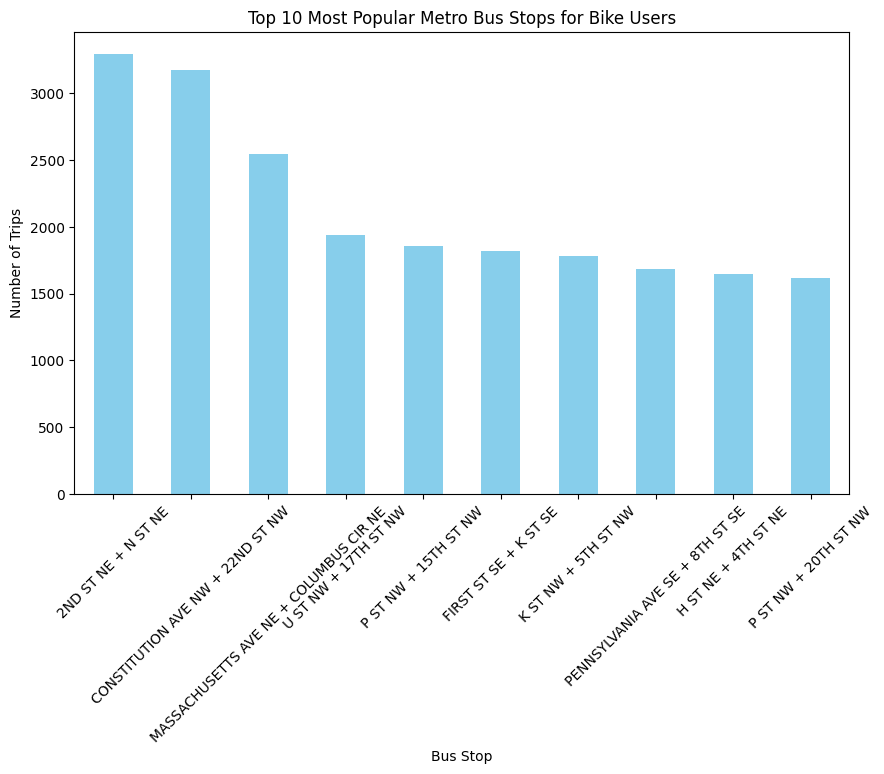

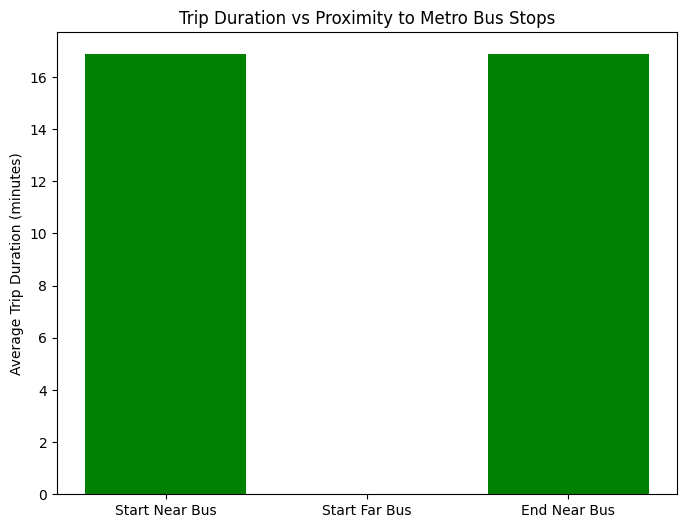

In [ ]:
# 5. Visualize Results
import matplotlib.pyplot as plt

# Bar chart for most popular bus stops
plt.figure(figsize=(10, 6))
most_popular_bus_stops.head(10).plot(kind='bar', color='skyblue')
plt.title("Top 10 Most Popular Metro Bus Stops for Bike Users")
plt.xlabel("Bus Stop")
plt.ylabel("Number of Trips")
plt.xticks(rotation=45)
plt.show()

# Plot relationship between trip duration and proximity to bus stops
plt.figure(figsize=(8, 6))
data = [
    avg_duration_near_bus_start, avg_duration_far_bus_start,
    avg_duration_near_bus_end, avg_duration_far_bus_end
]
labels = ['Start Near Bus', 'Start Far Bus', 'End Near Bus', 'End Far Bus']

plt.bar(labels, data, color=['green', 'red', 'green', 'red'])
plt.title("Trip Duration vs Proximity to Metro Bus Stops")
plt.ylabel("Average Trip Duration (minutes)")
plt.show()

In [ ]:
#------------------------------------------------------------------------------------------
# Main Task No. 2: User-behavioral analysis of capital bike share users
#------------------------------------------------------------------------------------------

# Check if datatime object already
cap_bks_oct['started_at'] = pd.to_datetime(cap_bks_oct['started_at'], errors='coerce')
cap_bks_oct['ended_at'] = pd.to_datetime(cap_bks_oct['ended_at'], errors='coerce')

print(cap_bks_oct['started_at'].dtype)

if pd.api.types.is_datetime64_any_dtype(cap_bks_oct['started_at']):
    cap_bks_oct['start_hour'] = cap_bks_oct['started_at'].dt.hour
    cap_bks_oct['end_hour'] = cap_bks_oct['ended_at'].dt.hour
    cap_bks_oct['day_of_week'] = cap_bks_oct['started_at'].dt.dayofweek
    cap_bks_oct['month'] = cap_bks_oct['started_at'].dt.month
else:
    print("Error: 'started_at' is not in a datetime format.")

cap_bks_oct['start_hour'] = cap_bks_oct['started_at'].dt.hour
cap_bks_oct['end_hour'] = cap_bks_oct['ended_at'].dt.hour
cap_bks_oct['day_of_week'] = cap_bks_oct['started_at'].dt.dayofweek
cap_bks_oct['month'] = cap_bks_oct['started_at'].dt.month

cap_bks_oct['user_type'] = cap_bks_oct['member_casual'].map({'casual': 0, 'member': 1})


datetime64[ns]


In [ ]:
def calculate_distance(row):
    start_point = (row['start_lat'], row['start_lng'])
    end_point = (row['end_lat'], row['end_lng'])
    return geodesic(start_point, end_point).kilometers

cap_bks_oct['distance'] = cap_bks_oct.apply(calculate_distance, axis=1)

In [ ]:
new_cap_bks_oct = cap_bks_oct[['distance', 'trip_duration', 'start_hour', 'end_hour', 'start_lat', 'start_lng',
                                 'end_lat', 'end_lng', 'start_metro_distance',
                                    'end_metro_distance', 'day_of_week', 'month', 'user_type']]

new_cap_bks_oct = pd.get_dummies(new_cap_bks_oct, columns=['day_of_week', 'month'], drop_first=True)

numerical_features = ['trip_duration', 'start_hour', 'end_hour', 'start_lat', 'start_lng',
                      'end_lat', 'end_lng', 'start_metro_distance',
                      'end_metro_distance']


In [ ]:
def scale_features(df, features):
    for feature in features:
        df[feature] = (df[feature] - df[feature].mean()) / df[feature].std()

    return df

new_cap_bks_oct = scale_features(new_cap_bks_oct, numerical_features)

In [ ]:
# Clustering
kmeans = KMeans(n_clusters=2, random_state=5834)

cluster = kmeans.fit_predict(new_cap_bks_oct)

new_cap_bks_oct['cluster'] = cluster

silhouette_avg = silhouette_score(new_cap_bks_oct, cluster)
print("Silhouette Score: ", silhouette_avg)

Silhouette Score:  0.17159880726132956


In [ ]:
def user_type_cluster(df):
    user_type = df.groupby('cluster').agg({
        'trip_duration': 'mean',
        'distance': 'mean',
        'start_metro_distance': 'mean',
        'end_metro_distance': 'mean',
    })

    return user_type

print(user_type_cluster(new_cap_bks_oct))


         trip_duration  distance  start_metro_distance  end_metro_distance
cluster                                                                   
0            -0.007870  2.004455              0.084929           -0.136497
1             0.005233  1.753414             -0.056473            0.090763


In [ ]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from geopy.distance import geodesic
from sklearn.preprocessing import StandardScaler

# Check and convert datetime columns
cap_bks_oct['started_at'] = pd.to_datetime(cap_bks_oct['started_at'], errors='coerce')
cap_bks_oct['ended_at'] = pd.to_datetime(cap_bks_oct['ended_at'], errors='coerce')

# Extract temporal features
cap_bks_oct['start_hour'] = cap_bks_oct['started_at'].dt.hour
cap_bks_oct['end_hour'] = cap_bks_oct['ended_at'].dt.hour
cap_bks_oct['day_of_week'] = cap_bks_oct['started_at'].dt.dayofweek
cap_bks_oct['month'] = cap_bks_oct['started_at'].dt.month

# Map user type (casual = 0, member = 1)
cap_bks_oct['user_type'] = cap_bks_oct['member_casual'].map({'casual': 0, 'member': 1})

# Add distance calculation using geopy
def calculate_distance(row):
    start_point = (row['start_lat'], row['start_lng'])
    end_point = (row['end_lat'], row['end_lng'])
    return geodesic(start_point, end_point).kilometers

cap_bks_oct['distance'] = cap_bks_oct.apply(calculate_distance, axis=1)

# Nearest Metro Bus Stop Analysis
from sklearn.neighbors import NearestNeighbors

def find_nearest_bus_stop(bike_coords, bus_coords, bus_df):
    neigh = NearestNeighbors(n_neighbors=1)
    neigh.fit(bus_coords)
    distances, indices = neigh.kneighbors(bike_coords)
    nearest_bus_stops = bus_df.iloc[indices.flatten()]["BSTP_MSG_TEXT"]
    return nearest_bus_stops.values, distances.flatten()

# Bus stop coordinates
bike_start_coords = cap_bks_oct[['start_lat', 'start_lng']].values
bike_end_coords = cap_bks_oct[['end_lat', 'end_lng']].values
bus_coords = bus_stops_data[['BSTP_LAT', 'BSTP_LON']].values

# Find nearest bus stops
nearest_bus_start, bus_start_distances = find_nearest_bus_stop(bike_start_coords, bus_coords, bus_stops_data)
nearest_bus_end, bus_end_distances = find_nearest_bus_stop(bike_end_coords, bus_coords, bus_stops_data)

# Add nearest bus stop features to the dataset
cap_bks_oct['nearest_start_bus'] = nearest_bus_start
cap_bks_oct['start_bus_distance'] = bus_start_distances
cap_bks_oct['nearest_end_bus'] = nearest_bus_end
cap_bks_oct['end_bus_distance'] = bus_end_distances

# Round distances for clarity
cap_bks_oct['start_bus_distance'] = cap_bks_oct['start_bus_distance'].round(2)
cap_bks_oct['end_bus_distance'] = cap_bks_oct['end_bus_distance'].round(2)

# Prepare new dataset for clustering
new_cap_bks_oct = cap_bks_oct[['distance', 'trip_duration', 'start_hour', 'end_hour', 'start_bus_distance',
                               'end_bus_distance', 'day_of_week', 'month', 'user_type']]

# One-hot encode day of the week and month
new_cap_bks_oct = pd.get_dummies(new_cap_bks_oct, columns=['day_of_week', 'month'], drop_first=True)

# Feature Scaling
scaler = StandardScaler()
numerical_features = ['trip_duration', 'start_hour', 'end_hour', 'distance', 'start_bus_distance', 'end_bus_distance']
new_cap_bks_oct[numerical_features] = scaler.fit_transform(new_cap_bks_oct[numerical_features])

# KMeans Clustering
kmeans = KMeans(n_clusters=2, random_state=42)
clusters = kmeans.fit_predict(new_cap_bks_oct)

new_cap_bks_oct['cluster'] = clusters

# Silhouette Score for evaluation
silhouette_avg = silhouette_score(new_cap_bks_oct, clusters)
print("Silhouette Score:", silhouette_avg)

# Cluster Analysis
def cluster_summary(df):
    summary = df.groupby('cluster').agg({
        'trip_duration': 'mean',
        'distance': 'mean',
        'start_bus_distance': 'mean',
        'end_bus_distance': 'mean',
    })
    return summary

print("Cluster Analysis Results:")
print(cluster_summary(new_cap_bks_oct))

# Interpret Results
# Cluster 0: Likely casual users - shorter trips, closer to bus stops
# Cluster 1: Likely members - longer trips, bus stops are farther

Silhouette Score: 0.30690568558512843
Cluster Analysis Results:
         trip_duration  distance  start_bus_distance  end_bus_distance
cluster                                                               
0            -0.048853  0.022888           -0.022935         -0.024661
1             0.032283 -0.015125            0.015156          0.016296


In [ ]:
#------------------------------------------------------------------------------------------
# Main Task No. 3: Predicting trip duration of a bike rider
#------------------------------------------------------------------------------------------

# Create new features
cap_bks_oct['num_bikes_available_start'] = 0
cap_bks_oct['num_free_docks_end'] = 0

cap_bks_oct.sort_values('started_at', inplace=True)

In [ ]:
cap_bks_oct['bikes_out_cumsum'] = cap_bks_oct.groupby('start_station_id').cumcount()

cap_bks_oct.sort_values('ended_at', inplace=True)

cap_bks_oct['bikes_in_cumsum'] = cap_bks_oct.groupby('end_station_id').cumcount()

cap_bks_oct['shifted_bikes_in_cumsum'] = cap_bks_oct.groupby('end_station_id')['bikes_in_cumsum'].shift(1).fillna(0)

cap_bks_oct.sort_values(by=['start_station_id', 'started_at'], inplace=True)

In [ ]:
cap_bks_oct['num_bikes_available_start'] = cap_bks_oct['shifted_bikes_in_cumsum'] - cap_bks_oct['bikes_out_cumsum']

cap_bks_oct.sort_values(by=['end_station_id', 'ended_at'], inplace=True)

cap_bks_oct['shifted_bikes_out_cumsum'] = cap_bks_oct.groupby('start_station_id')['bikes_out_cumsum'].shift(-1).fillna(method='ffill')

cap_bks_oct['num_free_docks_end'] = cap_bks_oct['shifted_bikes_out_cumsum'] - cap_bks_oct['bikes_in_cumsum']

cap_bks_oct['num_bikes_available_start'] = cap_bks_oct['num_bikes_available_start'].clip(lower=0)

cap_bks_oct['num_free_docks_end'] = cap_bks_oct['num_free_docks_end'].clip(lower=0)

In [ ]:
features = [
    'start_hour', 'day_of_week', 'month',
    'start_station_id', 'end_station_id',
    'start_metro_distance', 'end_metro_distance',
    'num_free_docks_end', 'num_bikes_available_start',
    'user_type'
]

X = cap_bks_oct[features]
y = cap_bks_oct['trip_duration']

X.drop(['start_station_id', 'end_station_id'], axis=1, inplace=True)

In [ ]:
X = pd.get_dummies(X, columns=['day_of_week', 'month'], drop_first=True)

numerical_features = ['start_hour', 'start_metro_distance', 'end_metro_distance', 'num_free_docks_end', 'num_bikes_available_start']

X = scale_features(X, numerical_features)

In [ ]:
X_train, X_test, y_train, y_test = tts(X, y, test_size=0.3, random_state=5834)

rf = RandomForestRegressor(n_estimators=100, random_state=5834)
rf.fit(X_train, y_train)

RandomForestRegressor(random_state=5834)

In [ ]:
y_pred = rf.predict(X_test)

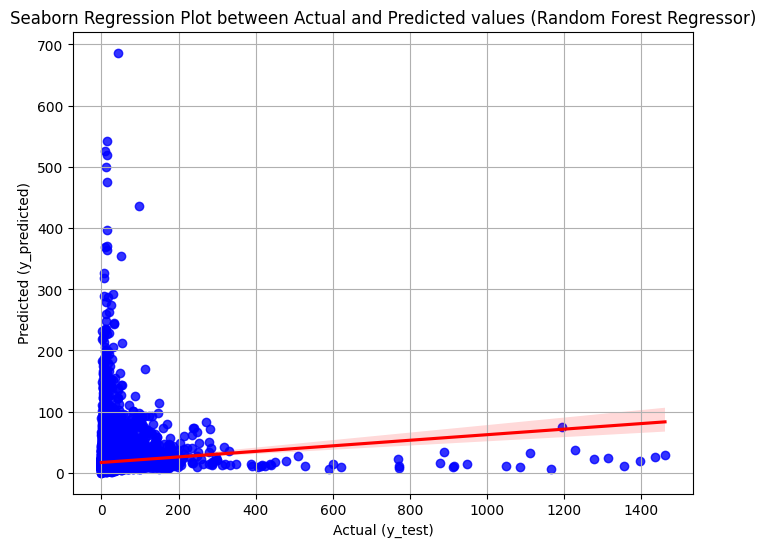

In [ ]:
plt.figure(figsize=(8, 6))
sns.regplot(x=y_test, y=y_pred, scatter_kws={'color': 'blue'}, line_kws={'color': 'red'})
plt.xlabel('Actual (y_test)')
plt.ylabel('Predicted (y_predicted)')
plt.title('Seaborn Regression Plot between Actual and Predicted values (Random Forest Regressor)')
plt.grid(True)
plt.show()

In [ ]:
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

print(f"MAE:{mae:.2f}")
print(f"MSE:{mse:.2f}")
print(f"RMSE:{rmse:.2f}")

MAE:13.30
MSE:1509.73
RMSE:38.86


In [95]:
import folium
from sklearn.neighbors import NearestNeighbors
from geopy.distance import geodesic
import openrouteservice as ors
from openrouteservice import convert
import pandas as pd

# Set up OpenRouteService client
client = ors.Client(key="5b3ce3597851110001cf6248da749d4d165f4265be8436d5d967afe9")

# Load Data
bus_stops_data = pd.read_csv('Metro_Bus_Stops.csv')
metro_data = pd.read_csv('Metro_Stations_Regional_Updated.csv')
cap_bike_data = pd.read_csv('202310-capitalbikeshare-tripdata.csv')

# Preprocess: Drop duplicates for efficiency
bike_stations = cap_bike_data[['start_station_id', 'start_station_name', 'start_lat', 'start_lng']].drop_duplicates()

# Generalized Nearest Location Finder
def get_nearest_location(df, lat, lng, lat_col, lng_col, num_nearest=1):
    df['distance'] = df.apply(lambda row: geodesic((lat, lng), (row[lat_col], row[lng_col])).kilometers, axis=1)
    return df.nsmallest(num_nearest, 'distance')

# Function to Get Routes
def get_route(start_lat, start_lng, end_lat, end_lng):
    coords = ((start_lng, start_lat), (end_lng, end_lat))
    response = client.directions(coords)
    encoded_route = response['routes'][0]['geometry']
    decoded_route = convert.decode_polyline(encoded_route)
    return [(lat, lng) for lng, lat in decoded_route['coordinates']]

# Offset Coordinates Slightly for Visibility
def offset_route(route, offset=0.0001):
    return [(lat + offset, lng + offset) for lat, lng in route]

# Input Validation
def validate_coordinates(lat, lng):
    if not (-90 <= lat <= 90 and -180 <= lng <= 180):
        raise ValueError("Invalid latitude or longitude values.")

# User Input
try:
    start_lat = float(input("Enter the latitude of the starting point: "))
    start_lng = float(input("Enter the longitude of the starting point: "))
    end_lat = float(input("Enter the latitude of the ending point: "))
    end_lng = float(input("Enter the longitude of the ending point: "))
    validate_coordinates(start_lat, start_lng)
    validate_coordinates(end_lat, end_lng)
except ValueError as e:
    print(e)
    exit()

# Find Nearest Capital Bike Share Stations
start_station = get_nearest_location(bike_stations, start_lat, start_lng, 'start_lat', 'start_lng').iloc[0]
end_station = get_nearest_location(bike_stations, end_lat, end_lng, 'start_lat', 'start_lng').iloc[0]

# Find Nearest Metro Station and Metro Bus Stop to the End Station
nearest_metro_station = get_nearest_location(metro_data, end_station['start_lat'], end_station['start_lng'], 'Y', 'X').iloc[0]
nearest_bus_stop = get_nearest_location(bus_stops_data, end_station['start_lat'], end_station['start_lng'], 'BSTP_LAT', 'BSTP_LON').iloc[0]

# Routes
route_to_bike = get_route(start_lat, start_lng, start_station['start_lat'], start_station['start_lng'])
route_between_bike_stations = get_route(start_station['start_lat'], start_station['start_lng'], end_station['start_lat'], end_station['start_lng'])
route_to_metro = get_route(end_station['start_lat'], end_station['start_lng'], nearest_metro_station['Y'], nearest_metro_station['X'])
route_to_bus = get_route(end_station['start_lat'], end_station['start_lng'], nearest_bus_stop['BSTP_LAT'], nearest_bus_stop['BSTP_LON'])

# Offset the start route slightly to avoid overlap
route_to_bike_offset = offset_route(route_to_bike)

# Visualization
def plot_routes(start_lat, start_lng, end_lat, end_lng, start_station, end_station,
                route_to_bike_offset, route_between_bike_stations, route_to_metro, route_to_bus,
                nearest_metro_station, nearest_bus_stop):
    m = folium.Map(location=[start_lat, start_lng], zoom_start=12, control_scale=True)

    # Markers
    folium.Marker([start_lat, start_lng], popup="Start Point").add_to(m)
    folium.Marker([end_lat, end_lng], popup="End Point", icon=folium.Icon(color='orange')).add_to(m)
    folium.Marker([start_station['start_lat'], start_station['start_lng']], popup="Nearest Start Bike Station", icon=folium.Icon(color='blue')).add_to(m)
    folium.Marker([end_station['start_lat'], end_station['start_lng']], popup="Nearest End Bike Station", icon=folium.Icon(color='green')).add_to(m)
    folium.Marker([nearest_metro_station['Y'], nearest_metro_station['X']], popup="Nearest Metro Station", icon=folium.Icon(color='red')).add_to(m)
    folium.Marker([nearest_bus_stop['BSTP_LAT'], nearest_bus_stop['BSTP_LON']], popup="Nearest Bus Stop", icon=folium.Icon(color='purple')).add_to(m)

    # Routes
    folium.PolyLine(route_to_bike_offset, color="blue", weight=2, opacity=0.7, popup="Adjusted Route to Start Bike Station").add_to(m)
    folium.PolyLine(route_between_bike_stations, color="orange", weight=2.5, opacity=1, popup="Route Between Bike Stations").add_to(m)
    folium.PolyLine(route_to_metro, color="green", weight=2.5, opacity=1, popup="Route to Nearest Metro Station").add_to(m)
    folium.PolyLine(route_to_bus, color="purple", weight=2.5, opacity=1, popup="Route to Nearest Bus Stop").add_to(m)

    # Save and Display
    m.save("full_routes_map.html")
    print("Map has been saved as 'full_routes_map.html'.")

plot_routes(
    start_lat, start_lng, end_lat, end_lng, start_station, end_station,
    route_to_bike_offset, route_between_bike_stations, route_to_metro, route_to_bus,
    nearest_metro_station, nearest_bus_stop
)

Enter the latitude of the starting point: 38.8984017
Enter the longitude of the starting point: -77.2111917
Enter the latitude of the ending point: 38.9026187
Enter the longitude of the ending point: -77.2037612
Map has been saved as 'full_routes_map.html'.
